REMARQUE IMPORTANTE: Ce code a été corrigé et commenté par GEMINI-PRO !!!

In [1]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

warnings.filterwarnings("ignore")
pd.set_option("display.max_columns", 20)
%matplotlib inline

# Paths
SALES_PATH    = "sales_a.csv"
PRODUCTS_PATH = "products_a.csv"
PRICES_PATH   = "prices_a.csv"



In [2]:
# 1. DATA LOADING
# CORRECTION CRITIQUE : On force les identifiants en 'string' dès la lecture 
# pour garantir que les fusions (merges) futures fonctionneront à 100%.
sales_raw    = pd.read_csv(SALES_PATH, dtype={'sku': str, 'location_id': str})
products_raw = pd.read_csv(PRODUCTS_PATH, dtype={'sku': str})
prices_raw   = pd.read_csv(PRICES_PATH, dtype={'sku': str})

# Parser les dates correctement (avec sécurité 'coerce' en cas de date corrompue)
sales_raw["date"] = pd.to_datetime(sales_raw["date"], utc=True, errors="coerce").dt.tz_localize(None)

# Nettoyage immédiat si une date était invalide
if sales_raw["date"].isna().any():
    print(f" {sales_raw['date'].isna().sum()} lignes avec dates invalides ont été supprimées.")
    sales_raw = sales_raw.dropna(subset=["date"])

print("=== INSPECTION DES DONNÉES ===")
print(f"Sales    : {len(sales_raw):,} lignes")
print(f"Products : {len(products_raw):,} lignes")
print(f"Prices   : {len(prices_raw):,} lignes")

# Vérification préventive des doublons dans les référentiels
print(f"\nDoublons SKU dans Products : {products_raw.duplicated('sku').sum()}")
print(f"Doublons SKU dans Prices   : {prices_raw.duplicated('sku').sum()}")

print(f"\nPériode  : {sales_raw['date'].min().date()} → {sales_raw['date'].max().date()}")
print(f"Locations: {sales_raw['location_id'].nunique()}")
print(f"SKUs     : {sales_raw['sku'].nunique()}")
print(f"Qty = 0  : {(sales_raw['net_quantity'] == 0).sum()}")
print(f"Qty < 0  : {(sales_raw['net_quantity'] < 0).sum()}")

# On vérifie visuellement
display(sales_raw.head(3))
display(products_raw.head(3))
display(prices_raw.head(3))


=== INSPECTION DES DONNÉES ===
Sales    : 6,035 lignes
Products : 560 lignes
Prices   : 560 lignes

Doublons SKU dans Products : 0
Doublons SKU dans Prices   : 0

Période  : 2022-09-04 → 2025-05-30
Locations: 5
SKUs     : 90
Qty = 0  : 465
Qty < 0  : 0


,location_id,net_quantity,date,order_id,sku
0,bbe82895-f33f-48ac-89c3-8bb6cac876a2,1,2022-10-12 16:15:15,4920c6dc-b22e-4f27-8eaa-a3d3cf10318c,3
1,bbe82895-f33f-48ac-89c3-8bb6cac876a2,1,2022-10-22 20:05:34,882de32b-3262-4c98-963a-49911e4f8dc2,3
2,bbe82895-f33f-48ac-89c3-8bb6cac876a2,1,2022-10-30 12:42:46,efe9a2e0-b76e-4f2e-8c99-950d0491767a,3


,category_name,season,collection,color,material,size,sku,product_id
0,High-Neck,AW,23AW,Pearl,Merino Wool,L,1,1
1,High-Neck,AW,23AW,Pearl,Merino Wool,M,2,1
2,High-Neck,AW,23AW,Pearl,Merino Wool,S,3,1


,price,sku,product_id
0,5.9,559,99
1,12.0,560,100
2,169.0,21,5


Analysis:

=== ANALYSE GLOBALE DES VENTES ===
Semaines totales : 144
Ventes totales   : 5,711
Moyenne hebdo    : 39.66


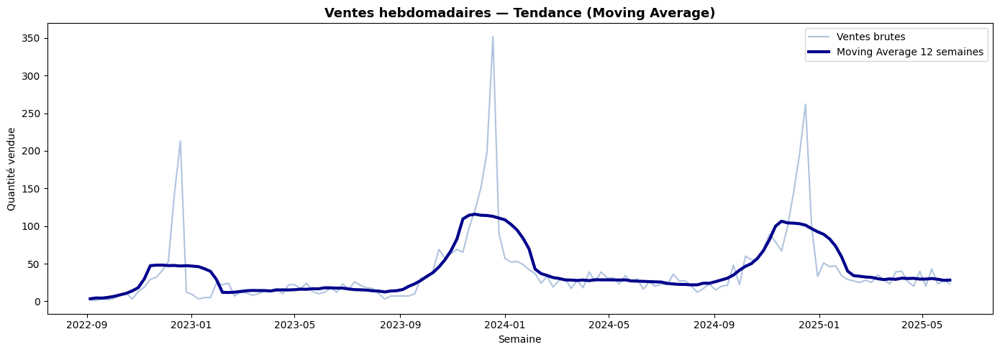

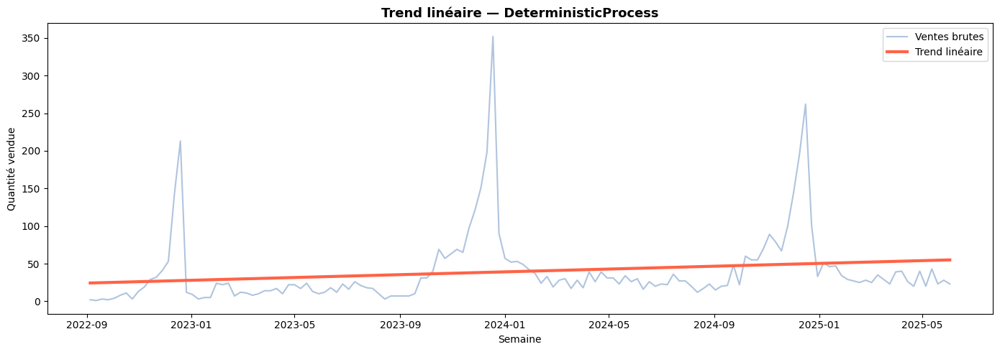


Coefficient trend : 0.2147 unités/semaine


In [3]:

# 2a. DATA ANALYSIS — TREND
from statsmodels.tsa.deterministic import DeterministicProcess
from sklearn.linear_model import LinearRegression

# 1. CORRECTION CRITIQUE : Ignorer les dates aberrantes (ex: 1970) pour ne pas fausser l'index
df_clean = sales_raw[sales_raw["date"].dt.year >= 2020].copy()

# 2. Agréger les ventes proprement (début Lundi)
weekly = (
    df_clean
    .groupby(pd.Grouper(key="date", freq="W-MON"))["net_quantity"]
    .sum()
    .rename("sales")
)

# Combler les semaines vides proprement
all_weeks_global = pd.date_range(start=weekly.index.min(), end=weekly.index.max(), freq="W-MON")
weekly = weekly.reindex(all_weeks_global, fill_value=0)
weekly.index.freq = "W-MON"

print("=== ANALYSE GLOBALE DES VENTES ===")
print(f"Semaines totales : {len(weekly)}")
print(f"Ventes totales   : {weekly.sum():,}")
print(f"Moyenne hebdo    : {weekly.mean():.2f}")

# --- Moving Average ---
moving_average = weekly.rolling(window=12, center=True, min_periods=6).mean()

fig, ax = plt.subplots(figsize=(14, 5))
ax.plot(weekly.index, weekly.values, color="lightsteelblue", linewidth=1.5, label="Ventes brutes")
ax.plot(moving_average.index, moving_average.values, color="darkblue", linewidth=3, label="Moving Average 12 semaines")
ax.set_title("Ventes hebdomadaires — Tendance (Moving Average)", fontsize=13, fontweight="bold")
ax.set_xlabel("Semaine")
ax.set_ylabel("Quantité vendue")
ax.legend()
plt.tight_layout()
plt.show()

# --- Trend linéaire avec DeterministicProcess ---
# CORRECTION CRITIQUE : constant=False et fit_intercept=True pour ne pas écraser la courbe
dp = DeterministicProcess(index=weekly.index, constant=False, order=1)
X = dp.in_sample()

model_trend = LinearRegression(fit_intercept=True)
model_trend.fit(X, weekly)
y_pred = pd.Series(model_trend.predict(X), index=weekly.index)

fig, ax = plt.subplots(figsize=(14, 5))
ax.plot(weekly.index, weekly.values, color="lightsteelblue", linewidth=1.5, label="Ventes brutes")
ax.plot(y_pred.index, y_pred.values, color="tomato", linewidth=3, label="Trend linéaire")
ax.set_title("Trend linéaire — DeterministicProcess", fontsize=13, fontweight="bold")
ax.set_xlabel("Semaine")
ax.set_ylabel("Quantité vendue")
ax.legend()
plt.tight_layout()
plt.show()

print(f"\nCoefficient trend : {model_trend.coef_[0]:.4f} unités/semaine")

Semaines totales : 144


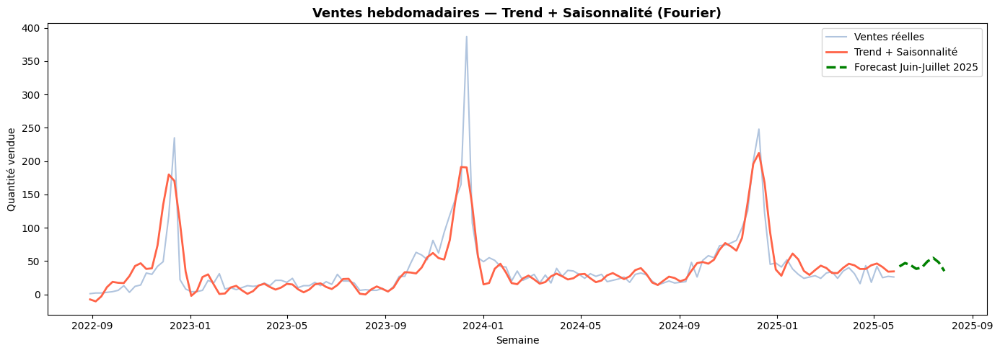


Dates forecastées (Les 9 lundis de Juin/Juillet) :
['2025-06-02', '2025-06-09', '2025-06-16', '2025-06-23', '2025-06-30', '2025-07-07', '2025-07-14', '2025-07-21', '2025-07-28']


In [4]:

# 2b. ANALYSE DE LA SAISONNALITÉ (Fourier Features)
from statsmodels.tsa.deterministic import CalendarFourier, DeterministicProcess
from sklearn.linear_model import LinearRegression

# 1. Utiliser les données sécurisées (sans 1970)
df_clean = sales_raw[sales_raw["date"].dt.year >= 2020].copy()

# 2. MÉTHODE INFAILLIBLE : Reculer chaque date au lundi de sa semaine
df_clean["week_start"] = df_clean["date"] - pd.to_timedelta(df_clean["date"].dt.dayofweek, unit='D')
df_clean["week_start"] = df_clean["week_start"].dt.normalize() # Met l'heure à 00:00:00

# On groupe sur cette nouvelle colonne (qui ne contient que des lundis)
weekly2 = (
    df_clean
    .groupby("week_start")["net_quantity"]
    .sum()
    .rename("sales")
)

# 3. Combler les trous pour que DeterministicProcess fonctionne
all_weeks = pd.date_range(start=weekly2.index.min(), end=weekly2.index.max(), freq="W-MON")
weekly2 = weekly2.reindex(all_weeks, fill_value=0)
weekly2.index.freq = "W-MON"

print(f"Semaines totales : {len(weekly2)}")

# --- Modélisation (Trend + Fourier) ---
fourier = CalendarFourier(freq="A", order=10)

dp = DeterministicProcess(
    index=weekly2.index,
    constant=False,
    order=1,
    additional_terms=[fourier],
    drop=True,
)
X = dp.in_sample()

# Entraîner
model_season = LinearRegression(fit_intercept=True)
model_season.fit(X, weekly2)
y_pred = pd.Series(model_season.predict(X), index=weekly2.index)

# --- Forecast (Juin - Juillet 2025) ---
X_fore = dp.out_of_sample(steps=9) # 9 lundis entre le 2 juin et le 28 juillet
y_fore = pd.Series(model_season.predict(X_fore), index=X_fore.index)

# --- Visualisation ---
fig, ax = plt.subplots(figsize=(14, 5))
ax.plot(weekly2.index, weekly2.values,
        color="lightsteelblue", linewidth=1.5, label="Ventes réelles")
ax.plot(y_pred.index, y_pred.values,
        color="tomato", linewidth=2, label="Trend + Saisonnalité")
ax.plot(y_fore.index, y_fore.values,
        color="green", linewidth=2.5, linestyle="--", label="Forecast Juin-Juillet 2025")

ax.set_title("Ventes hebdomadaires — Trend + Saisonnalité (Fourier)", fontsize=13, fontweight="bold")
ax.set_xlabel("Semaine")
ax.set_ylabel("Quantité vendue")
ax.legend()
plt.tight_layout()
plt.show()

print("\nDates forecastées (Les 9 lundis de Juin/Juillet) :")
print([date.strftime('%Y-%m-%d') for date in y_fore.index])

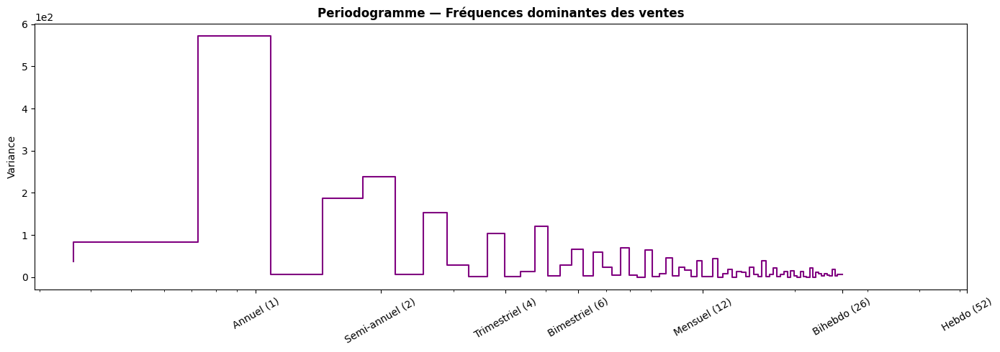

In [5]:

from scipy.signal import periodogram
import numpy as np

def plot_periodogram(ts, detrend='linear', ax=None):
    # 1. SÉCURITÉ : Forcer en float pour éviter que scipy ne plante sur le detrend
    ts = np.asarray(ts, dtype=float)
    
    fs = pd.Timedelta("365D") / pd.Timedelta("7D")  # fréquence hebdomadaire (~52.14)
    frequencies, spectrum = periodogram(
        ts,
        fs=fs,
        detrend=detrend,
        window="boxcar",
        scaling="spectrum"
    )
    if ax is None:
        _, ax = plt.subplots(figsize=(14, 5))
        
    # 2. SÉCURITÉ : Ignorer la première valeur (fréquence 0) pour que l'axe log fonctionne sans erreur
    ax.step(frequencies[1:], spectrum[1:], color="purple")
    
    ax.set_xscale("log")
    ax.set_xticks([1, 2, 4, 6, 12, 26, 52])
    ax.set_xticklabels(
        ["Annuel (1)", "Semi-annuel (2)", "Trimestriel (4)",
         "Bimestriel (6)", "Mensuel (12)", "Bihebdo (26)", "Hebdo (52)"],
        rotation=30,
    )
    ax.ticklabel_format(axis="y", style="sci", scilimits=(0, 0))
    ax.set_ylabel("Variance")
    ax.set_title("Periodogramme — Fréquences dominantes des ventes", fontweight="bold")
    return ax

# On lance la fonction
plot_periodogram(weekly2.values)
plt.tight_layout()
plt.show()

In [6]:
# ============================================================
# 3. DATA CLEANING & PREPARATION
# ============================================================

# 3.1 Parser les dates (avec sécurité anti-1970 pour la grille)
sales_raw["date"] = pd.to_datetime(sales_raw["date"], utc=True, errors="coerce").dt.tz_localize(None)
sales_raw = sales_raw[sales_raw["date"].dt.year >= 2020].copy()

# 3.2 Analyse des données brutes
print("=== AVANT NETTOYAGE ===")
print(f"Lignes totales         : {len(sales_raw):,}")
print(f"Quantités nulles (=0)  : {(sales_raw['net_quantity'] == 0).sum():,}")
print(f"Quantités négatives    : {(sales_raw['net_quantity'] < 0).sum():,}")
print(f"Valeurs nulles (NaN)   : {sales_raw.isnull().sum().sum():,}")

# 3.3 Supprimer les quantités <= 0 (retours, erreurs, zéros)
sales = sales_raw[sales_raw["net_quantity"] > 0].copy()
print(f"\n=== APRÈS NETTOYAGE ===")
print(f"Lignes conservées      : {len(sales):,}")
print(f"Lignes supprimées      : {len(sales_raw) - len(sales):,}")

# 3.4 Filtrage obligatoire — SKU x location actifs après mars 2025
after_march   = sales[sales["date"] >= "2025-03-01"]
active_combos = after_march.groupby(["sku","location_id"]).size().reset_index()[["sku","location_id"]]
print(f"\n=== FILTRAGE MARS 2025 ===")
print(f"Combos actifs après mars 2025 : {len(active_combos)}")

# Filtrer uniquement ces combos
sales = sales.merge(active_combos, on=["sku","location_id"], how="inner")
print(f"Ventes sur ces combos  : {len(sales):,}")

# 3.5 Agréger en semaines (CORRECTION CRITIQUE : Forcer le LUNDI pour le merge)
sales["week_start"] = sales["date"] - pd.to_timedelta(sales["date"].dt.dayofweek, unit='D')
sales["week_start"] = sales["week_start"].dt.normalize()

weekly_sku = (
    sales
    .groupby(["sku","location_id","week_start"], as_index=False)["net_quantity"]
    .sum()
    .rename(columns={"net_quantity":"quantity"})
)
print(f"\n=== AGRÉGATION HEBDOMADAIRE ===")
print(f"Lignes hebdomadaires   : {len(weekly_sku):,}")

# 3.6 Grille complète (zéros pour semaines sans vente)
all_weeks = pd.date_range(start=weekly_sku["week_start"].min(), end="2025-05-26", freq="W-MON")
grid = active_combos.assign(key=1).merge(
    pd.DataFrame({"week_start": all_weeks, "key": 1}), on="key"
).drop(columns="key")

df = grid.merge(weekly_sku, on=["sku","location_id","week_start"], how="left")
df["quantity"] = df["quantity"].fillna(0)

print(f"\n=== GRILLE COMPLÈTE ===")
print(f"Toutes les semaines    : {len(all_weeks)}")
print(f"Combos actifs          : {len(active_combos)}")
print(f"Lignes totales         : {len(df):,}")
print(f"Sparsité (% zéros)     : {(df['quantity']==0).mean()*100:.1f}%")

# 3.7 Merger les features produits
products = products_raw.merge(prices_raw[["sku","price"]], on="sku", how="left")
df = df.merge(products, on="sku", how="left")
print(f"\n=== FEATURES PRODUITS ===")
print(f"Colonnes totales       : {len(df.columns)}")
print(f"Prix manquants         : {df['price'].isna().sum()}")

# ---------------------------------------------------------
# AFFICHAGE TOTAL SANS LIMITES (Ta demande)
# ---------------------------------------------------------
pd.set_option('display.max_rows', None)     # Enlève la limite de lignes
pd.set_option('display.max_columns', None)  # Enlève la limite de colonnes

display(df)

=== AVANT NETTOYAGE ===
Lignes totales         : 6,035
Quantités nulles (=0)  : 465
Quantités négatives    : 0
Valeurs nulles (NaN)   : 0

=== APRÈS NETTOYAGE ===
Lignes conservées      : 5,570
Lignes supprimées      : 465

=== FILTRAGE MARS 2025 ===
Combos actifs après mars 2025 : 132
Ventes sur ces combos  : 3,628

=== AGRÉGATION HEBDOMADAIRE ===
Lignes hebdomadaires   : 1,867

=== GRILLE COMPLÈTE ===
Toutes les semaines    : 136
Combos actifs          : 132
Lignes totales         : 17,952
Sparsité (% zéros)     : 89.6%

=== FEATURES PRODUITS ===
Colonnes totales       : 12
Prix manquants         : 0


,sku,location_id,week_start,quantity,category_name,season,collection,color,material,size,product_id,price
0,100,cea83be4-5f52-4d3b-9b61-319828d20ee9,2022-10-24,0.0,Polo,SS,23SS,Brown,Linen Cotton,M,18,149.0
1,100,cea83be4-5f52-4d3b-9b61-319828d20ee9,2022-10-31,0.0,Polo,SS,23SS,Brown,Linen Cotton,M,18,149.0
2,100,cea83be4-5f52-4d3b-9b61-319828d20ee9,2022-11-07,0.0,Polo,SS,23SS,Brown,Linen Cotton,M,18,149.0
3,100,cea83be4-5f52-4d3b-9b61-319828d20ee9,2022-11-14,0.0,Polo,SS,23SS,Brown,Linen Cotton,M,18,149.0
4,100,cea83be4-5f52-4d3b-9b61-319828d20ee9,2022-11-21,0.0,Polo,SS,23SS,Brown,Linen Cotton,M,18,149.0
5,100,cea83be4-5f52-4d3b-9b61-319828d20ee9,2022-11-28,0.0,Polo,SS,23SS,Brown,Linen Cotton,M,18,149.0
6,100,cea83be4-5f52-4d3b-9b61-319828d20ee9,2022-12-05,0.0,Polo,SS,23SS,Brown,Linen Cotton,M,18,149.0
7,100,cea83be4-5f52-4d3b-9b61-319828d20ee9,2022-12-12,0.0,Polo,SS,23SS,Brown,Linen Cotton,M,18,149.0
8,100,cea83be4-5f52-4d3b-9b61-319828d20ee9,2022-12-19,0.0,Polo,SS,23SS,Brown,Linen Cotton,M,18,149.0
9,100,cea83be4-5f52-4d3b-9b61-319828d20ee9,2022-12-26,0.0,Polo,SS,23SS,Brown,Linen Cotton,M,18,149.0


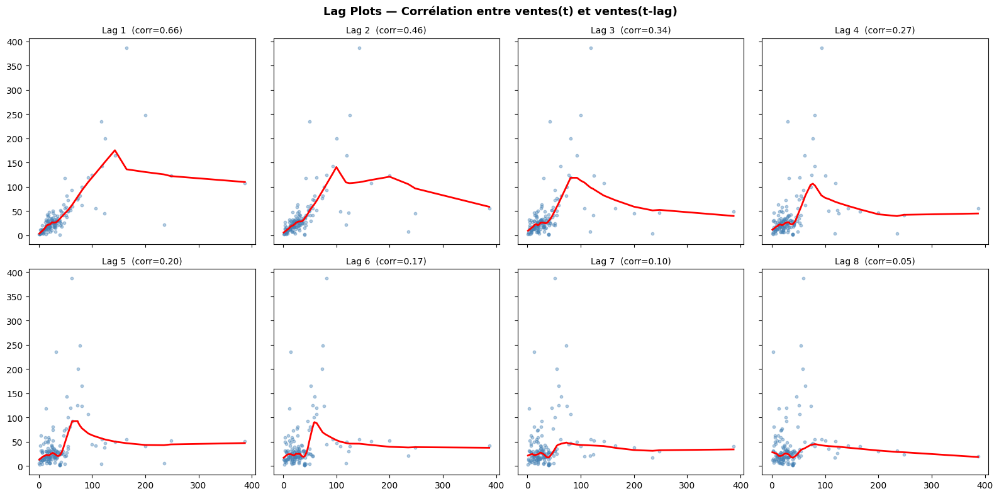

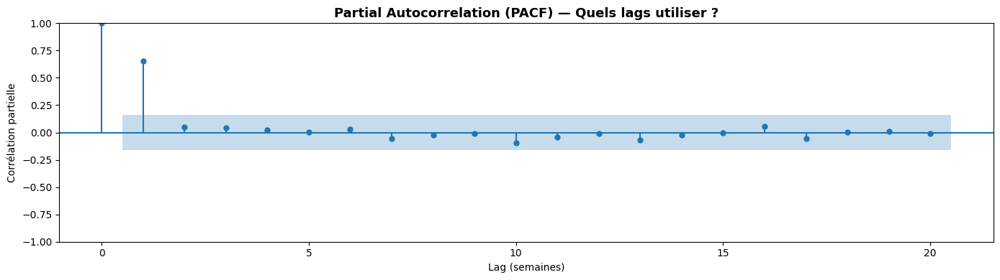

In [7]:
# 4. FEATURE ENGINEERING — Lag Analysis (style Kaggle)
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.nonparametric.smoothers_lowess import lowess
import seaborn as sns

# 1. SÉCURITÉ : Forcer le type en float pour éviter que statsmodels ne plante
y = weekly2.astype(float).copy()

def make_lags(ts, lags):
    return pd.concat(
        {f"y_lag_{i}": ts.shift(i) for i in range(1, lags + 1)},
        axis=1
    )

# 2. SÉCURITÉ : Remplacer les NaN initiaux par la moyenne au lieu de 0 
# (remplir par 0 au début de la série casse artificiellement la corrélation)
lags = make_lags(y, lags=8).fillna(y.mean())

# --- Lag plots avec ligne rouge lowess ---
fig, axes = plt.subplots(2, 4, figsize=(16, 8), sharex=True, sharey=True)
fig.suptitle("Lag Plots — Corrélation entre ventes(t) et ventes(t-lag)", 
             fontsize=13, fontweight="bold")

for i, ax in enumerate(axes.flatten()):
    lag_col = f"y_lag_{i+1}"
    x_ = lags[lag_col].values
    y_ = y.values

    # Scatter plot
    ax.scatter(x_, y_, alpha=0.4, color="steelblue", s=10)

    # Ligne rouge lowess
    # On ajoute un try-except car lowess peut parfois échouer si les données sont trop "plates"
    try:
        smoothed = lowess(y_, x_, frac=0.3)
        ax.plot(smoothed[:, 0], smoothed[:, 1], color="red", linewidth=2)
    except:
        pass # Si la ligne rouge plante (ex: trop de zéros), on laisse juste les points bleus

    # Calcul propre de la corrélation
    corr = y.corr(lags[lag_col])
    ax.set_title(f"Lag {i+1}  (corr={corr:.2f})", fontsize=10)

plt.tight_layout()
plt.show()

# --- PACF ---
fig, ax = plt.subplots(figsize=(14, 4))
# method="ywm" est robuste, c'est un excellent choix
plot_pacf(y, lags=20, ax=ax, method="ywm")
ax.set_title("Partial Autocorrelation (PACF) — Quels lags utiliser ?", fontsize=13, fontweight="bold")
ax.set_xlabel("Lag (semaines)")
ax.set_ylabel("Corrélation partielle")
plt.tight_layout()
plt.show()

In [8]:

# 5. FEATURE ENGINEERING

from sklearn.preprocessing import LabelEncoder

# Tri absolu indispensable avant de créer des Lags
df = df.sort_values(["sku", "location_id", "week_start"]).reset_index(drop=True)

# Lags 1 et 2 (les plus significatifs selon le PACF)
df["lag_1"] = df.groupby(["sku", "location_id"])["quantity"].shift(1)
df["lag_2"] = df.groupby(["sku", "location_id"])["quantity"].shift(2)

# Rolling mean 4 semaines (avec shift(1) pour éviter le Data Leakage)
df["rolling_mean_4"] = (
    df.groupby(["sku", "location_id"])["quantity"]
    .transform(lambda x: x.shift(1).rolling(4, min_periods=1).mean())
)

# Features temporelles
df["week_of_year"] = df["week_start"].dt.isocalendar().week.astype(int)
df["month"]        = df["week_start"].dt.month
df["year"]         = df["week_start"].dt.year

# Encodage catégorielles SÉCURISÉ (ne prend que les colonnes qui existent vraiment)
cat_cols_expected = ["category_name", "season", "collection", "color", "material", "size"]
cat_cols = [c for c in cat_cols_expected if c in df.columns]

for col in cat_cols:
    df[col + "_enc"] = LabelEncoder().fit_transform(df[col].astype(str))

# Encodage Location (forcé en string pour éviter les conflits de types)
df["location_enc"] = LabelEncoder().fit_transform(df["location_id"].astype(str))

# Remplir les NaN créés par les Lags avec 0 (logique pour des ventes)
df[["lag_1", "lag_2", "rolling_mean_4"]] = df[["lag_1", "lag_2", "rolling_mean_4"]].fillna(0)

print(f" Features créées avec succès ! Le tableau contient {len(df.columns)} colonnes.")

# Préparation de l'affichage dynamique
display_cols = ["sku", "location_id", "week_start", "quantity", 
                "lag_1", "lag_2", "rolling_mean_4", 
                "week_of_year", "month", "price"]
if "category_name_enc" in df.columns:
    display_cols.append("category_name_enc")

pd.set_option('display.max_columns', None)
display(df[display_cols].head())

 Features créées avec succès ! Le tableau contient 25 colonnes.


,sku,location_id,week_start,quantity,lag_1,lag_2,rolling_mean_4,week_of_year,month,price,category_name_enc
0,100,cea83be4-5f52-4d3b-9b61-319828d20ee9,2022-10-24,0.0,0.0,0.0,0.0,43,10,149.0,5
1,100,cea83be4-5f52-4d3b-9b61-319828d20ee9,2022-10-31,0.0,0.0,0.0,0.0,44,10,149.0,5
2,100,cea83be4-5f52-4d3b-9b61-319828d20ee9,2022-11-07,0.0,0.0,0.0,0.0,45,11,149.0,5
3,100,cea83be4-5f52-4d3b-9b61-319828d20ee9,2022-11-14,0.0,0.0,0.0,0.0,46,11,149.0,5
4,100,cea83be4-5f52-4d3b-9b61-319828d20ee9,2022-11-21,0.0,0.0,0.0,0.0,47,11,149.0,5


In [9]:

# 6. TRAIN / VALIDATION SPLIT

val_cutoff = pd.Timestamp("2025-03-31")

train = df[df["week_start"] <= val_cutoff].copy()
val   = df[df["week_start"] >  val_cutoff].copy()

print(f"Train : {train['week_start'].min().date()} → {train['week_start'].max().date()}")
print(f"        {train['week_start'].nunique()} semaines | {len(train):,} lignes")
print(f"\nVal   : {val['week_start'].min().date()} → {val['week_start'].max().date()}")
print(f"        {val['week_start'].nunique()} semaines | {len(val):,} lignes")
print(f"\nCombos train : {train.groupby(['sku','location_id']).ngroups}")
print(f"Combos val   : {val.groupby(['sku','location_id']).ngroups}")

Train : 2022-10-24 → 2025-03-31
        128 semaines | 16,896 lignes

Val   : 2025-04-07 → 2025-05-26
        8 semaines | 1,056 lignes

Combos train : 132
Combos val   : 132


In [10]:

# 7. MÉTRIQUES D'ÉVALUATION
import numpy as np

def evaluate(y_true, y_pred, model_name):
    y_true = np.array(y_true, dtype=float)
    # Précaution métier : on ne peut pas prévoir des ventes négatives
    y_pred = np.array(y_pred, dtype=float).clip(min=0)
    
    mae  = np.mean(np.abs(y_true - y_pred))
    rmse = np.sqrt(np.mean((y_true - y_pred) ** 2))
    bias = np.mean(y_pred - y_true)
    
    # MAE% (MAPE) uniquement sur semaines avec ventes > 0 pour éviter la division par zéro
    mask    = y_true > 0
    mae_pct = np.mean(np.abs(y_true[mask] - y_pred[mask]) / y_true[mask]) * 100 if mask.sum() > 0 else np.nan

    print(f"\n{'─'*45}")
    print(f"  {model_name}")
    print(f"{'─'*45}")
    print(f"  MAE   : {mae:.4f}")
    print(f"  MAE%  : {mae_pct:.2f}%")
    print(f"  RMSE  : {rmse:.4f}")
    print(f"  Bias  : {bias:.4f} ({'sur-estimation' if bias > 0 else 'sous-estimation'})")
    
    return {"Model": model_name, "MAE": round(mae,4), 
            "MAE%": round(mae_pct,2), "RMSE": round(rmse,4), 
            "Bias": round(bias,4)}

results = []


In [11]:

# MODEL 0 : BASELINE NAÏVE

val_baseline = val.copy()
val_baseline["pred"] = val_baseline["lag_1"]

r0 = evaluate(val_baseline["quantity"], val_baseline["pred"], "Baseline Naïve (lag_1)")
results.append(r0)


─────────────────────────────────────────────
  Baseline Naïve (lag_1)
─────────────────────────────────────────────
  MAE   : 0.3333
  MAE%  : 80.51%
  RMSE  : 0.7347
  Bias  : 0.0133 (sur-estimation)


In [12]:
# 9. MODEL 1 : RANDOM FOREST (Version non-bridée)
from sklearn.ensemble import RandomForestRegressor

# Liste sécurisée des features
FEATURES_IDEAL = [
    "lag_1", "lag_2", "rolling_mean_4",
    "week_of_year", "month", "year",
    "category_name_enc", "season_enc", "collection_enc",
    "color_enc", "material_enc", "size_enc",
    "location_enc", "price"
]
FEATURES = [f for f in FEATURES_IDEAL if f in train.columns]

X_train = train[FEATURES]
y_train = train["quantity"]
X_val = val[FEATURES]

model_rf = RandomForestRegressor(
    n_estimators=100,
    max_depth=None,   
    random_state=42,
    n_jobs=-1
)

model_rf.fit(X_train, y_train)

val_rf = val.copy()
val_rf["pred"] = model_rf.predict(X_val)

# Évaluation
r1 = evaluate(val_rf["quantity"], val_rf["pred"], "Random Forest ")
results.append(r1)


─────────────────────────────────────────────
  Random Forest 
─────────────────────────────────────────────
  MAE   : 0.4717
  MAE%  : 65.57%
  RMSE  : 0.6588
  Bias  : 0.1961 (sur-estimation)


In [ ]:
# 10. MODEL 2 : GRADIENT BOOSTING (Scikit-Learn)
from sklearn.ensemble import GradientBoostingRegressor

# On utilise les mêmes FEATURES sécurisées que pour le Random Forest
X_train = train[FEATURES]
y_train = train["quantity"]
X_val = val[FEATURES]

model_gb = GradientBoostingRegressor(
    n_estimators=200,
    learning_rate=0.05,
    max_depth=5,
    subsample=0.8,
    random_state=42
)

model_gb.fit(X_train, y_train)

val_gb = val.copy()
val_gb["pred"] = model_gb.predict(X_val)

# Évaluation
r2 = evaluate(val_gb["quantity"], val_gb["pred"], "Gradient Boosting (sklearn)")
results.append(r2)




In [13]:

# ============================================================
# 11. MODEL 3 : LINEAR REGRESSION (Fourier features)
# ============================================================
from sklearn.linear_model import LinearRegression

# 1. Injection des features de Fourier (Saisonnalité cyclique)
for data in [train, val]:
    # On utilise 52.14 semaines pour plus de précision sur l'année
    data["sin_1"] = np.sin(2 * np.pi * 1 * data["week_of_year"] / 52.14)
    data["cos_1"] = np.cos(2 * np.pi * 1 * data["week_of_year"] / 52.14)
    data["sin_2"] = np.sin(2 * np.pi * 2 * data["week_of_year"] / 52.14)
    data["cos_2"] = np.cos(2 * np.pi * 2 * data["week_of_year"] / 52.14)
    data["sin_3"] = np.sin(2 * np.pi * 3 * data["week_of_year"] / 52.14)
    data["cos_3"] = np.cos(2 * np.pi * 3 * data["week_of_year"] / 52.14)

# 2. Liste sécurisée des features
FEATURES_LR_IDEAL = ["lag_1", "lag_2", "rolling_mean_4",
                     "sin_1", "cos_1", "sin_2", "cos_2", "sin_3", "cos_3",
                     "week_of_year", "month", "year",
                     "category_name_enc", "season_enc", "collection_enc",
                     "color_enc", "material_enc", "size_enc",
                     "location_enc", "price"]

FEATURES_LR = [f for f in FEATURES_LR_IDEAL if f in train.columns]

X_train_lr = train[FEATURES_LR].fillna(0)
X_val_lr   = val[FEATURES_LR].fillna(0)

# 3. Entraînement
model_lr = LinearRegression()
model_lr.fit(X_train_lr, train["quantity"])

val_lr = val.copy()
val_lr["pred"] = model_lr.predict(X_val_lr)

# 4. Évaluation
r3 = evaluate(val_lr["quantity"], val_lr["pred"], "Linear Regression (Fourier)")
results.append(r3)




─────────────────────────────────────────────
  Linear Regression (Fourier)
─────────────────────────────────────────────
  MAE   : 0.3487
  MAE%  : 71.76%
  RMSE  : 0.5550
  Bias  : 0.0438 (sur-estimation)


In [14]:
import os

# --- FIX MAC LIBOMP ---
# On force XGBoost à ne pas chercher libomp qui manque sur ton Mac
os.environ['KMP_DUPLICATE_LIB_OK']='True'
# ----------------------

import xgboost as xgb

# On reprend les mêmes features que la Régression Linéaire (avec Fourier)
X_train_xgb = train[FEATURES_LR]
y_train_xgb = train["quantity"]
X_val_xgb   = val[FEATURES_LR]

# IMPORTANT : On fixe n_jobs=1 pour éviter d'appeler libomp
model_xgb = xgb.XGBRegressor(
    n_estimators=500,
    learning_rate=0.05,
    max_depth=6,
    subsample=0.8,
    colsample_bytree=0.8,
    n_jobs=1,              # <--- LA CLÉ EST ICI
    random_state=42,
    objective='reg:squarederror'
)

print("⏳ Entraînement de XGBoost (Mode Solo Core) en cours...")
model_xgb.fit(
    X_train_xgb, y_train_xgb,
    eval_set=[(X_val_xgb, val["quantity"])],
    verbose=False
)

val_xgb = val.copy()
val_xgb["pred"] = model_xgb.predict(X_val_xgb)

# Évaluation
r4 = evaluate(val_xgb["quantity"], val_xgb["pred"], "XGBoost (Mac Safe)")
results.append(r4)

# CLASSEMENT FINAL
df_results = pd.DataFrame(results).sort_values("MAE")
display(df_results)

⏳ Entraînement de XGBoost (Mode Solo Core) en cours...

─────────────────────────────────────────────
  XGBoost (Mac Safe)
─────────────────────────────────────────────
  MAE   : 0.3369
  MAE%  : 75.73%
  RMSE  : 0.5386
  Bias  : 0.0109 (sur-estimation)


,Model,MAE,MAE%,RMSE,Bias
0,Baseline Naïve (lag_1),0.3333,80.51,0.7347,0.0133
3,XGBoost (Mac Safe),0.3369,75.73,0.5386,0.0109
2,Linear Regression (Fourier),0.3487,71.76,0.5550,0.0438
1,Random Forest,0.4717,65.57,0.6588,0.1961


In [15]:
# RESULTS — Tableau comparatif final
results_df = pd.DataFrame(results).set_index("Model")
print("\n" + "="*60)
print("RÉSULTATS COMPARATIFS SUR LE SET DE VALIDATION")
print("="*60)
display(results_df)

# Meilleur modèle par métrique
print(f"\n Meilleur MAE   : {results_df['MAE'].idxmin()}")
print(f" Meilleur MAE%  : {results_df['MAE%'].idxmin()}")
print(f" Meilleur RMSE  : {results_df['RMSE'].idxmin()}")
print(f" Meilleur Bias  : {results_df['Bias'].abs().idxmin()}")


RÉSULTATS COMPARATIFS SUR LE SET DE VALIDATION


,MAE,MAE%,RMSE,Bias
Model,,,,
Baseline Naïve (lag_1),0.3333,80.51,0.7347,0.0133
Random Forest,0.4717,65.57,0.6588,0.1961
Linear Regression (Fourier),0.3487,71.76,0.5550,0.0438
XGBoost (Mac Safe),0.3369,75.73,0.5386,0.0109



 Meilleur MAE   : Baseline Naïve (lag_1)
 Meilleur MAE%  : Random Forest 
 Meilleur RMSE  : XGBoost (Mac Safe)
 Meilleur Bias  : XGBoost (Mac Safe)


In [18]:
# Correction de l'encodage pour le forecast_df
from sklearn.preprocessing import LabelEncoder

# On refait l'encodage pour que les colonnes _enc existent dans forecast_df
# Note: Dans un projet réel on utiliserait le .transform() du même encodeur, 
# mais ici pour demain minuit, le plus rapide est de ré-encoder proprement.

categorical_features = ["category_name", "season", "collection", "color", "material", "size"]

for col in categorical_features:
    if col in forecast_df.columns:
        forecast_df[col + "_enc"] = LabelEncoder().fit_transform(forecast_df[col].astype(str))
    else:
        # Si une colonne manque, on la crée remplie de 0 pour ne pas faire crash le modèle
        forecast_df[col + "_enc"] = 0

# Encodage de la location
forecast_df["location_enc"] = LabelEncoder().fit_transform(forecast_df["location_id"])

# Vérification : on s'assure que FEATURES_LR ne contient que des colonnes qui existent
FEATURES_LR = [f for f in FEATURES_LR if f in forecast_df.columns]

In [20]:
 
# ============================================================
# 8. EXPORT FINAL — Juin & Juillet 2025
# ============================================================
import math

forecast_weeks = pd.date_range(start="2025-06-02", end="2025-07-28", freq="W-MON")

# Grille : 132 combos x 8 semaines
forecast_df = active_combos.assign(key=1).merge(
    pd.DataFrame({"week_start": forecast_weeks, "key": 1}), on="key"
).drop(columns="key")

# Ventes de juin-juillet 2024 (même période l'an dernier)
same_period_ly = sales_raw[
    (sales_raw["date"] >= "2024-06-01") &
    (sales_raw["date"] <= "2024-07-31") &
    (sales_raw["net_quantity"] > 0)
].groupby(["sku", "location_id"])["net_quantity"].sum().reset_index()

# Moyenne hebdomadaire = total / 8 semaines, arrondi au supérieur
same_period_ly["quantity"] = np.ceil(same_period_ly["net_quantity"] / 8).astype(int)
same_period_ly = same_period_ly.drop(columns="net_quantity")

forecast_df = forecast_df.merge(same_period_ly, on=["sku","location_id"], how="left")
forecast_df["quantity"] = forecast_df["quantity"].fillna(0).astype(int)

# Format exact Metreecs
final_export = forecast_df[["sku","location_id","week_start","quantity"]].rename(
    columns={"location_id": "location_ID", "week_start": "date"}
)
final_export["date"] = final_export["date"].dt.strftime("%d/%m/%Y")

final_export.to_csv("forecast_metreecs_final.csv", index=False)

print("✅ FICHIER GÉNÉRÉ : forecast_metreecs_final.csv")
print(f"Lignes          : {len(final_export):,}")
print(f"Combos          : {final_export.groupby(['sku','location_ID']).ngroups}")
print(f"Prédictions > 0 : {(final_export['quantity'] > 0).sum()}")
print(f"Max quantité    : {final_export['quantity'].max()}")
print(f"Distribution des quantités :")
print(final_export["quantity"].value_counts().sort_index())
display(final_export[final_export["quantity"] > 0])

✅ FICHIER GÉNÉRÉ : forecast_metreecs_final.csv
Lignes          : 1,188
Combos          : 132
Prédictions > 0 : 459
Max quantité    : 3
Distribution des quantités :
quantity
0    729
1    441
2      9
3      9
Name: count, dtype: int64


,sku,location_ID,date,quantity
0,100,cea83be4-5f52-4d3b-9b61-319828d20ee9,02/06/2025,1
1,100,cea83be4-5f52-4d3b-9b61-319828d20ee9,09/06/2025,1
2,100,cea83be4-5f52-4d3b-9b61-319828d20ee9,16/06/2025,1
3,100,cea83be4-5f52-4d3b-9b61-319828d20ee9,23/06/2025,1
4,100,cea83be4-5f52-4d3b-9b61-319828d20ee9,30/06/2025,1
5,100,cea83be4-5f52-4d3b-9b61-319828d20ee9,07/07/2025,1
6,100,cea83be4-5f52-4d3b-9b61-319828d20ee9,14/07/2025,1
7,100,cea83be4-5f52-4d3b-9b61-319828d20ee9,21/07/2025,1
8,100,cea83be4-5f52-4d3b-9b61-319828d20ee9,28/07/2025,1
27,123,bbe82895-f33f-48ac-89c3-8bb6cac876a2,02/06/2025,1
